**Research topic: COVID-19 transmission modelling simulation and visualization** 

Huynh Ngoc Tram Nguyen 

Supervisor: Dr. Dimitri Perrin 




In [1]:
import pandas as pd
import numpy as np
import networkx as nx
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.animation as animation

## TABLE OF CONTENTS<a name="contents"></a>
**[1. Simulation Visualizations](#header)**

**[1.1 COVID-19 transmission at a population level](#task1)**

- **[1.1.1 SEIR model](#task1.1)**
- **[1.1.2 Customized SEIR model](#task1.2)**
- **[1.1.3. The number of cases from overseas and from different types of contacts ](#task1.3)**

**[1.2. COVID-19 transmission at an individual level](#task2)**
- **[1.2.1 Explore the network](#task2.1)**
- **[1.2.2. Animate the network at an individual level](#task2.2)**
- **[1.2.3. Clustering nodes into communities and visualizing](#task2.3)**
    - **[1.2.3.1. Explore the community partition with Louvain algorithm](#task2.3.1)**
    - **[1.2.3.2. Animate COVID transmission at a community level](#task2.3.2)**
    


# 1. Simulation Visualizations <a name="header"></a>


## 1.1 COVID-19 transmission at a population level<a name="task1"></a>

This part is to visualize the outputs of COVID-19 transmission simulation at a population level based on SEIR model and customized SEIR model. 

In [2]:
df = pd.read_csv('data/test_1000_2020-04-19_16-04-12.txt', sep='\s{1,}',engine='python')
df

,Timestamp,Susceptible,Exposed,Infectious,Recovered,Deaths,susceptible,latent_1,latent_2,symptomatic_0,...,symptomatic_2,recovered,dead,nb_cases,nb_confirmedCases,nb_confirmed_overseas,nb_confirmed_contactOverseas,nb_confirmed_contactKnown,nb_confirmed_unknown,nb_symptomatic_cases
0,0,990,10,0,0,0,990,10,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,990,10,0,0,0,990,10,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,990,10,0,0,0,990,10,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,990,10,0,0,0,990,10,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,990,10,0,0,0,990,10,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26276,26276,59,0,0,934,7,59,0,0,0,...,0,934,7,941,47,4,2,4,37,130
26277,26277,59,0,0,934,7,59,0,0,0,...,0,934,7,941,47,4,2,4,37,130
26278,26278,59,0,0,934,7,59,0,0,0,...,0,934,7,941,47,4,2,4,37,130
26279,26279,59,0,0,934,7,59,0,0,0,...,0,934,7,941,47,4,2,4,37,130


### 1.1.1 SEIR model <a name="task1.1"></a>
- S - Susceptible: The number of people who are susceptible to the COVID-19 disease. 

- E: Exposed: The number of people who are exposed to the COVID-19 disease.  

- I - Infectious: The number of people who are infected with the COVID-19 disease.  

- R - Recovered: The number of people who have recovered from the COVID-19 disease.  

- D - Deaths: The number of people who are dead due to the COVID-19 disease. 

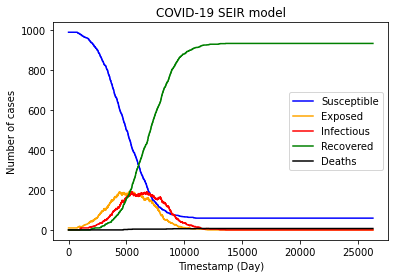

In [3]:
plt.plot(df['Timestamp'],df['Susceptible'], label="Susceptible", color='Blue')
plt.plot(df['Timestamp'],df['Exposed'],label="Exposed", color = 'Orange')
plt.plot(df['Timestamp'],df['Infectious'],label="Infectious", color='Red')
plt.plot(df['Timestamp'],df['Recovered'],label="Recovered", color='Green')
plt.plot(df['Timestamp'],df['Deaths'],label="Deaths", color='Black')
plt.title('COVID-19 SEIR model')
plt.legend(loc='center right')
plt.xlabel('Timestamp (Day)')
plt.ylabel('Number of cases')
plt.show()

### 1.1.2. Customized SEIR model:  <a name="task1.2"></a>
This model illustrates more details than the SEIR model in the section 2.1.1. In this model, we divide the number of `Exposed` people into 2 stages. In `latent_1` stage, it illustrates the number of people who are exposed to the COVID-19 disease but they do not infect others yet. In `latent_2` stage, those exposed people start to transmit the disease to other people. When people are `Infectious`, there are 3 levels of severity. `symptomatic_0` is the number of people who are positive with COVID-19 but the disease is a symtomatic case. `symptomatic_1` is the number of people who are positive with COVID-19 but the disease is a mild case. `symptomatic_2` is the number of people who are positive with COVID-19 but the disease is a severe case. People who are in `symptomatic_0` and  `symptomatic_1` can recover from the disease, while people who are in `symptomatic_1` and `symptomatic_2` can be dead due to COVID-19. 

- S - Susceptible: The number of people who are susceptible to the COVID-19 disease. 

- E - Exposed: The number of people who are exposed to the COVID-19 disease, including `latent_1` (being exposed to COVID-19 but not infecting others) and `latent_2` (being exposed to COVID-19 and start infecting others). 

- I - Infectious: The number of people who are infected with the COVID-19 disease, including 2 stages `symptomatic_0` (the disease is slight), `symptomatic_1` (the disease is more severe) and `symptomatic_1` (the disease is the most severe).

- R - Recovered: The number of people who have recovered from the COVID-19 disease. (Infected people with `symptomatic_0` and `symptomatic_1` can recover from COVID-19).

- D - Deaths: The number of people who are dead due to the COVID-19 disease. (Infected people with `symptomatic_1` and `symptomatic_2` can be dead due to COVID-19). 

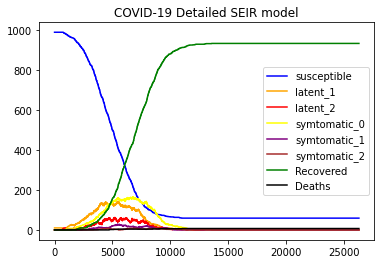

In [4]:
plt.plot(df['Timestamp'],df['susceptible'], label="susceptible", color='Blue')
plt.plot(df['Timestamp'],df['latent_1'],label="latent_1", color = 'Orange')
plt.plot(df['Timestamp'],df['latent_2'],label="latent_2", color='Red')
plt.plot(df['Timestamp'],df['symptomatic_0'],label="symtomatic_0", color='Yellow')
plt.plot(df['Timestamp'],df['symptomatic_1'],label="symtomatic_1", color='Purple')
plt.plot(df['Timestamp'],df['symptomatic_2'],label="symtomatic_2", color='Brown')
plt.plot(df['Timestamp'],df['Recovered'],label="Recovered", color='Green')
plt.plot(df['Timestamp'],df['Deaths'],label="Deaths", color='Black')
plt.title('COVID-19 Detailed SEIR model')
plt.legend(loc='center right')
plt.show()

### 1.1.3. The number of cases from overseas and from different types of contacts <a name="task1.3"></a>

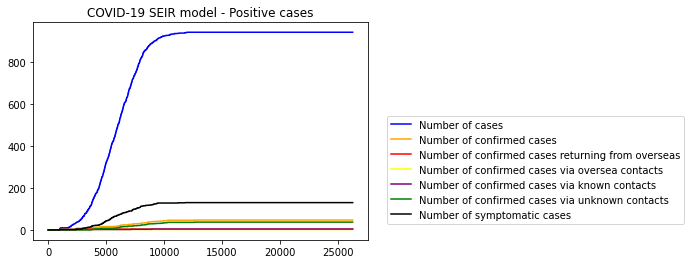

In [5]:
v1=plt.plot(df['Timestamp'],df['nb_cases'], label="Number of cases", color='Blue')
v2=plt.plot(df['Timestamp'],df['nb_confirmedCases'],label="Number of confirmed cases", color = 'Orange')
v3=plt.plot(df['Timestamp'],df['nb_confirmed_overseas'],label="Number of confirmed cases returning from overseas", color='Red')
v4=plt.plot(df['Timestamp'],df['nb_confirmed_contactOverseas'],label="Number of confirmed cases via oversea contacts", color='Yellow')
v5=plt.plot(df['Timestamp'],df['nb_confirmed_contactKnown'],label="Number of confirmed cases via known contacts", color='Purple')
v6=plt.plot(df['Timestamp'],df['nb_confirmed_unknown'],label="Number of confirmed cases via unknown contacts", color='Green')
v7=plt.plot(df['Timestamp'],df['nb_symptomatic_cases'],label="Number of symptomatic cases", color='Black')
plt.title('COVID-19 SEIR model - Positive cases')
plt.legend(loc='lower center',bbox_to_anchor=(1.5, 0.05))
plt.show()

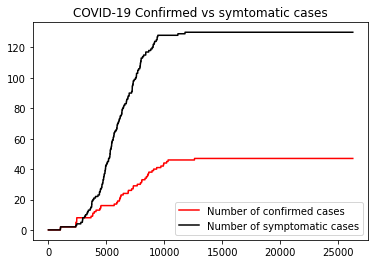

In [6]:
plt.plot(df['Timestamp'],df['nb_confirmedCases'],label="Number of confirmed cases", color = 'Red')
plt.plot(df['Timestamp'],df['nb_symptomatic_cases'],label="Number of symptomatic cases", color='Black')
plt.title('COVID-19 Confirmed vs symtomatic cases')
plt.legend(loc='lower right')
plt.show()

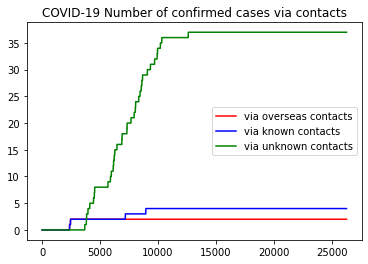

In [7]:
plt.plot(df['Timestamp'],df['nb_confirmed_contactOverseas'],label="via overseas contacts", color='Red')
plt.plot(df['Timestamp'],df['nb_confirmed_contactKnown'],label="via known contacts", color='Blue')
plt.plot(df['Timestamp'],df['nb_confirmed_unknown'],label="via unknown contacts", color='Green')
plt.title('COVID-19 Number of confirmed cases via contacts')
plt.legend(loc='center right')
plt.show() 

[Back to Top](#contents)
## 1.2 COVID-19 transmission at an individual level<a name="task2"></a>

### 1.2.1. Explore the network <a name="task2.1"></a>

In [8]:
#read the network 
g=nx.read_edgelist('data/network_to_share_1000.txt', create_using=nx.Graph(),nodetype=int)

In [9]:
#information about the graph 
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 1000
Number of edges: 4308
Average degree:   8.6160


(-1.8218647837638855,
 1.9746894240379333,
 -1.8853207349777221,
 2.1850152730941774)

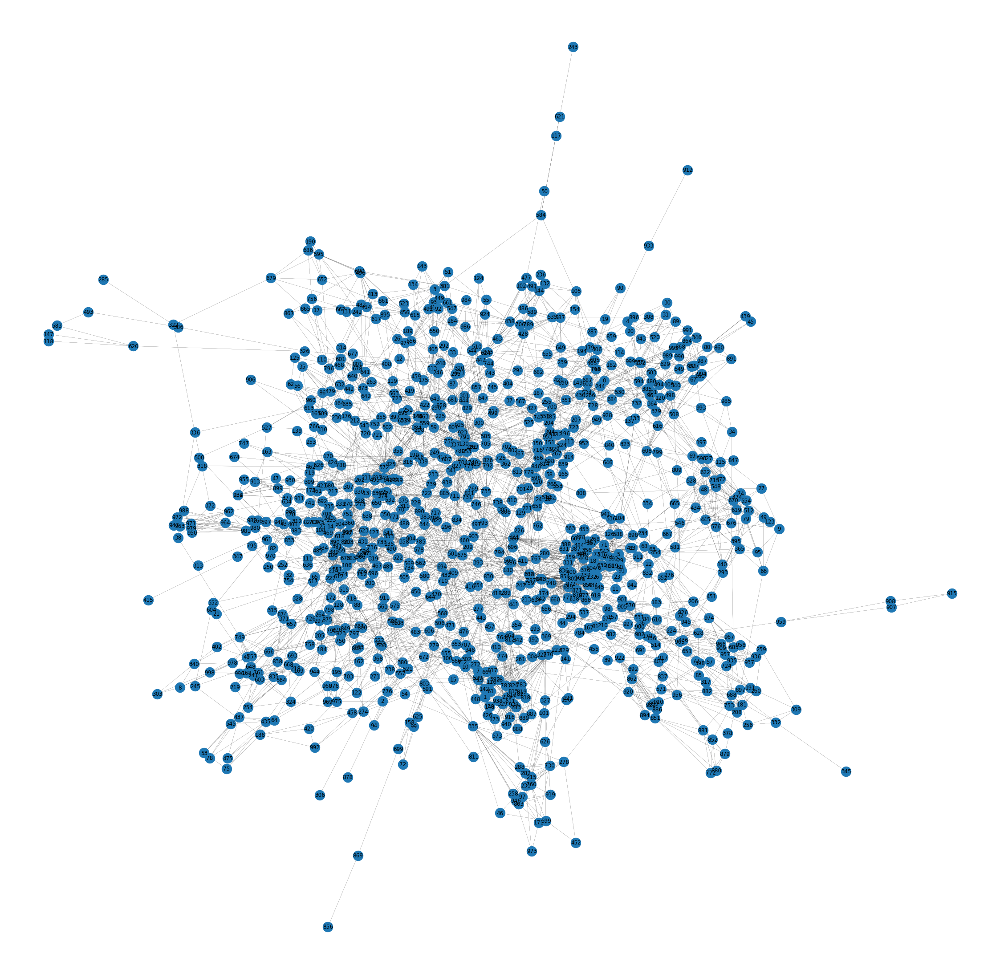

In [10]:
#build network graph
pos=nx.spring_layout(g,scale=2)
plt.figure(figsize=(40,40))
nx.draw_networkx_nodes(g, pos,node_size=500)
nx.draw_networkx_edges(g, pos,width=0.2)
nx.draw_networkx_labels(g, pos)
plt.axis('off')

(-2.1774384021759032,
 1.7262064456939696,
 -1.7964981377124787,
 1.8944677889347077)

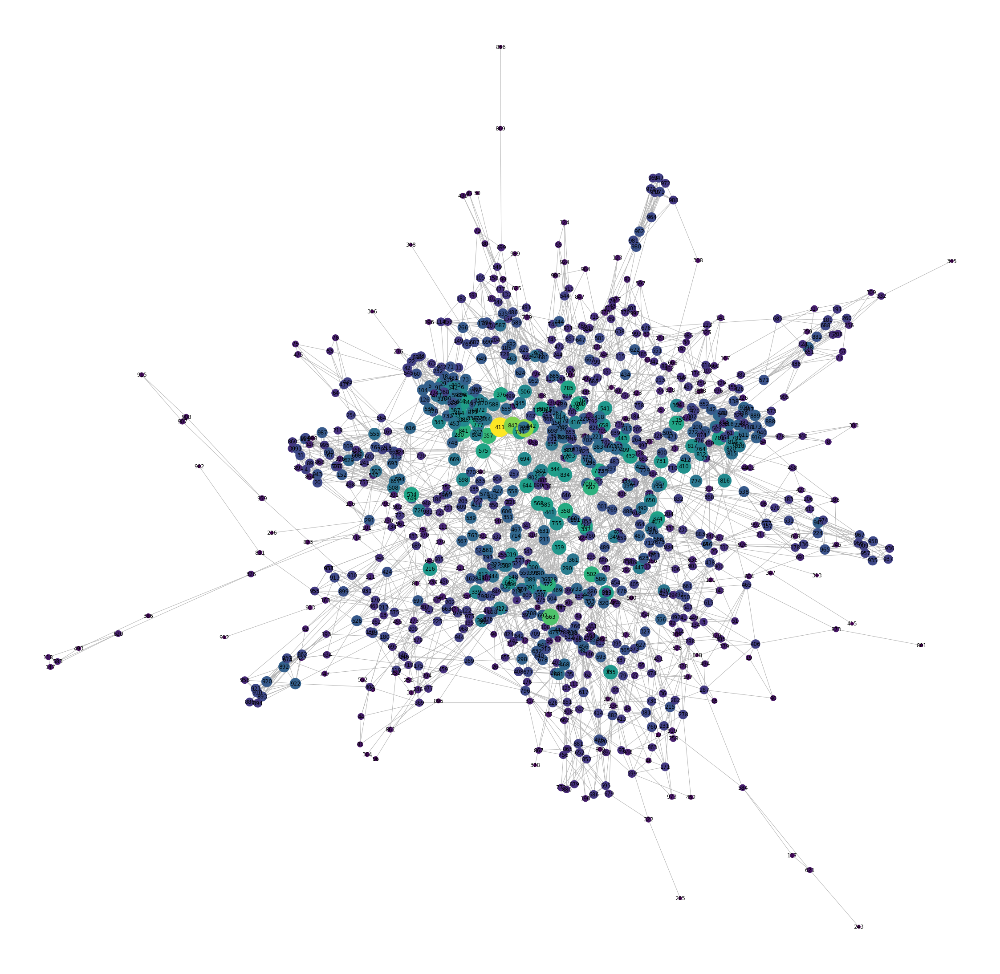

In [11]:
#Degree centrality is a simple count of the total number of connections linked to a node 
plt.figure(figsize=(40,40))
pos=nx.spring_layout(g, scale=2)
degreeCen=nx.degree_centrality(g)
node_color=[10000*g.degree(v) for v in g]
node_size=[v*50000 for v in degreeCen.values()]
nx.draw_networkx(g,pos=pos, node_color=node_color,node_size=node_size,edge_color='.7',edge_width=0.2)
plt.axis('off')

In [12]:
sorted(degreeCen,key=degreeCen.get,reverse=True)[:5]

[411, 366, 843, 563, 357]

Statuses and colors:
 - 0: susceptible - silver
 - 1: latent_1 - grey
 - 2: latent_2 - lightcoral
 - 3: symptomatic_0 - salmon
 - 4: symptomatic_1 - orange
 - 5: symptomatic_2 - red
 - 6: recovered - blue
 - 7: dead - black 
 
Status description:
 - latent_1: exposed
 - latent_2: to account for pre-symptomatic transmission
 - symptomatic_0: asymptomatic cases
 - symptomatic_1: mild cases
 - symptomatic_2:severe cases
 - recovered
 - dead

[Back to Top](#contents)
### 1.2.2. Animate the network at an individual level <a name="task2.2"></a>

In [13]:
#read the statuses of nodes
statuses = [[int(v) for v in line.split()] for line in open('data/test_animation_1000_2020-07-03_15-10-02.txt')]
colors = {0: 'silver', 1: 'grey', 2: 'lightcoral', 3: 'salmon', 4: 'orange', 5: 'red', 6: 'blue', 7: 'black'}

In [14]:
# map colors with statuses
def status(statuses):
    for s in statuses:
        yield list(map(lambda x: colors[x], s))  # map statuses to their colors

#count step
def step(statuses):
    num = 0
    while num<=len(statuses):
        yield num
        num += 1
        
#create a layout for the network      
pos = nx.spring_layout(g)

In [ ]:
# animation with full data (each timeframe is 10 minutes) - takes > 3 hours to run 
plt.figure(figsize=(40,40))
color_map = status(statuses)

def draw_next_status(n):
    plt.cla()
    c_map = next(color_map)
    nx.draw(g, pos, node_color=c_map, node_size=50, edge_color='0.7', edge_width=0.1, with_labels=False, alpha=0.5)
        
plt.ion()

ani = animation.FuncAnimation(plt.gcf(), draw_next_status ,interval=1, repeat=False, frames=len(statuses)-1)
plt.tight_layout()
plt.ioff()
plt.show()

#save animation
ani.save('covid19.gif', writer='Pillow')

#save animation
#ani.save('output/covid19.gif', writer='Pillow')

#result is recorded by QuickTime Player software and named as "SEIR_fulldata.mp4"

MovieWriter Pillow unavailable; using Pillow instead.


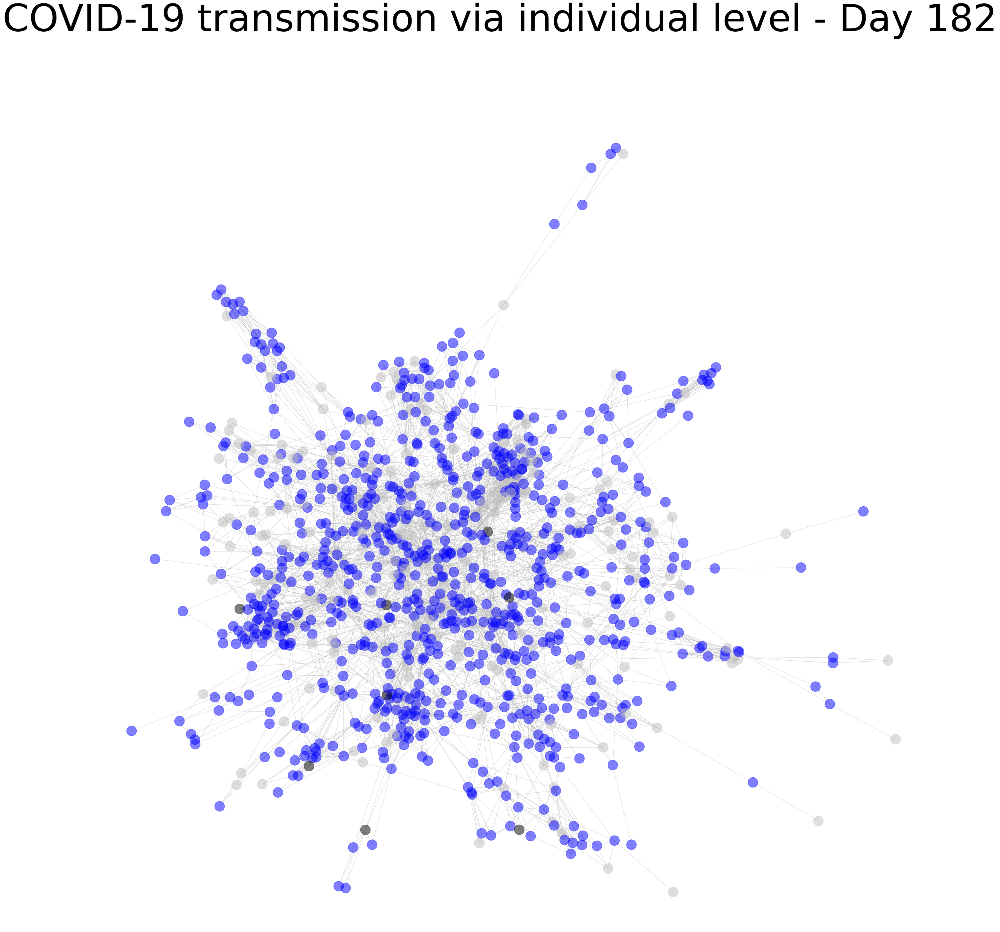

In [15]:
#animation with COVID-19 daily data (each timeframe is 1 day)
import numpy as np
plt.figure(figsize=(40,40))

idx=np.arange(0, len(statuses), 144).tolist()

statuses_slice_daily=[statuses[i] for i in idx]

color_map = status(statuses_slice_daily)
day=step(statuses_slice_daily)

#overwrite the draw_next_status function - add "Day" information
def draw_next_status(n):
    plt.cla()
    c_map = next(color_map, colors.values())
    nx.draw(g, pos, node_color=c_map, node_size=700, edge_color='0.7', edge_width=0.1, with_labels=False, alpha=0.5)
    plt.suptitle("COVID-19 transmission via individual level - Day "+str(next(day)),size=100)
        
ani = animation.FuncAnimation(plt.gcf(), draw_next_status, interval=500, frames=len(idx)-1, repeat=False)

ani.save('output/covid_day.gif', writer='Pillow')

MovieWriter Pillow unavailable; using Pillow instead.


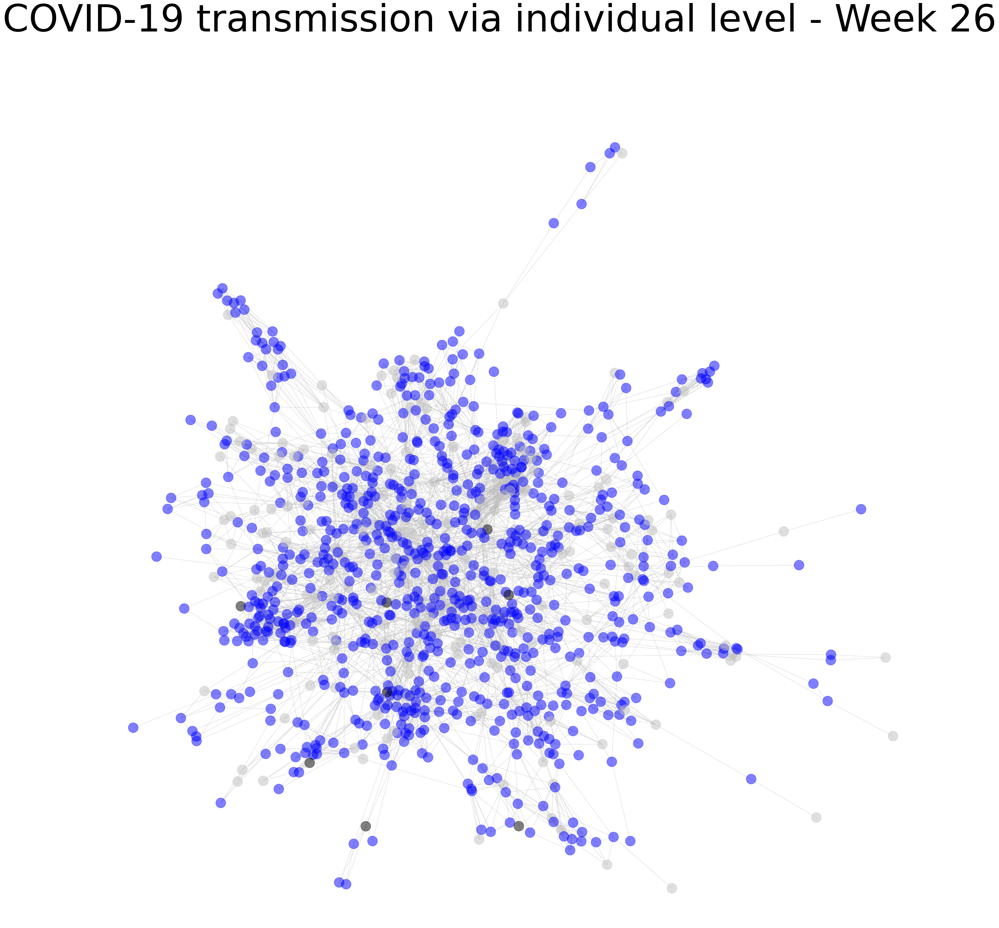

In [16]:
#animation with COVID-19 weekly data (each timeframe is 1 week)
import numpy as np
plt.figure(figsize=(40,40))

idx=np.arange(0, len(statuses), 1008).tolist()
statuses_slice_weekly=[statuses[i] for i in idx]
 
color_map = status(statuses_slice_weekly)
week=step(statuses_slice_weekly)

#overwrite the draw_next_status function - add "Week" information
def draw_next_status(n):
    plt.cla()
    c_map = next(color_map, colors.values())
    nx.draw(g, pos, node_color=c_map, node_size=700, edge_color='0.7', edge_width=0.1, with_labels=False, alpha=0.5)
    plt.suptitle("COVID-19 transmission via individual level - Week "+str(next(week)),size=100)
        
ani = animation.FuncAnimation(plt.gcf(), draw_next_status, interval=1000, frames=len(idx)-1, repeat=False)


ani.save('output/covid_week.gif', writer='Pillow')

[Back to Top](#contents)
### 1.2.3. Clustering nodes into communities and visualizing <a name="task2.3"></a>

#### 1.2.3.1 Explore the community partition with Louvain algorithm <a name="task2.3.1"></a>

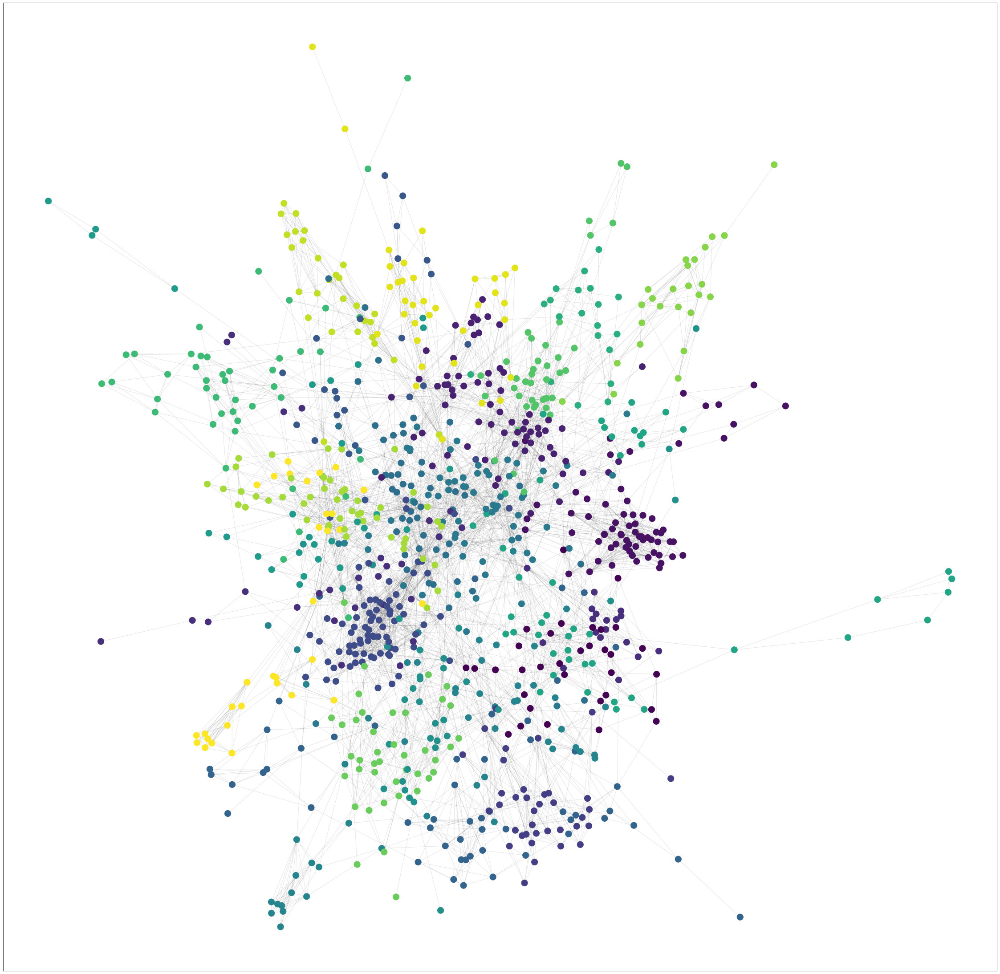

In [17]:
#partition nodes into communities
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx

# compute the best partition
partition = community_louvain.best_partition(g)

# draw the graph
pos = nx.spring_layout(g)
plt.figure(figsize=(40,40))
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(g, pos, partition.keys(), node_size=200,
                       cmap=cmap,node_color=list(partition.values()),mark_groups=True)
nx.draw_networkx_edges(g, pos, alpha=0.1)
plt.show()


In [18]:
community_cluster = []
for community in set(partition.values()):
    list_nodes = [nodes for nodes in partition.keys()
                      if partition[nodes] == community]
    community_cluster = community_cluster + [list_nodes]
    list_edges = [edges for edges in partition.keys()
                      if partition[edges] == community]
    
node_mapping = {}
count = 0
for node in g.nodes():
    node_mapping[node] = count
    count += 1

community_num_group = len(community_cluster)

In [19]:
community_cluster 

[[0,
  558,
  700,
  137,
  34,
  480,
  115,
  676,
  985,
  993,
  69,
  74,
  434,
  472,
  715,
  727,
  123,
  581,
  622,
  665,
  334,
  619,
  427,
  530,
  198,
  684,
  323,
  667,
  999,
  670,
  799,
  847,
  997],
 [1,
  412,
  448,
  7,
  15,
  28,
  142,
  426,
  443,
  573,
  781,
  782,
  889,
  939,
  61,
  304,
  410,
  148,
  272,
  707,
  710,
  713,
  938,
  10,
  302,
  409,
  100,
  138,
  483,
  116,
  770,
  54,
  368,
  476,
  458,
  816,
  817,
  774,
  432,
  471,
  103,
  672,
  764,
  155,
  470,
  505,
  229,
  664,
  173,
  611,
  819,
  529,
  888,
  887,
  283,
  329,
  818,
  820,
  188,
  420,
  992,
  245,
  604,
  648,
  940,
  812,
  815,
  916,
  783],
 [2,
  94,
  521,
  557,
  560,
  582,
  969,
  47,
  299,
  399,
  330,
  692,
  122,
  108,
  153,
  469,
  504,
  733,
  172,
  572,
  195,
  533,
  162,
  238,
  271,
  976,
  359,
  361,
  222,
  763,
  797,
  606,
  848,
  214,
  574,
  612,
  319,
  391,
  177,
  211,
  975,
  380,
  776,
 

In [20]:
for i in set(partition.values()):
    print ("Community", i)
    members = list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == i]
    print (members)

Community 0
[0, 558, 700, 137, 34, 480, 115, 676, 985, 993, 69, 74, 434, 472, 715, 727, 123, 581, 622, 665, 334, 619, 427, 530, 198, 684, 323, 667, 999, 670, 799, 847, 997]
Community 1
[1, 412, 448, 7, 15, 28, 142, 426, 443, 573, 781, 782, 889, 939, 61, 304, 410, 148, 272, 707, 710, 713, 938, 10, 302, 409, 100, 138, 483, 116, 770, 54, 368, 476, 458, 816, 817, 774, 432, 471, 103, 672, 764, 155, 470, 505, 229, 664, 173, 611, 819, 529, 888, 887, 283, 329, 818, 820, 188, 420, 992, 245, 604, 648, 940, 812, 815, 916, 783]
Community 2
[2, 94, 521, 557, 560, 582, 969, 47, 299, 399, 330, 692, 122, 108, 153, 469, 504, 733, 172, 572, 195, 533, 162, 238, 271, 976, 359, 361, 222, 763, 797, 606, 848, 214, 574, 612, 319, 391, 177, 211, 975, 380, 776, 803, 275, 360, 390, 389, 279, 568, 849, 561, 708, 358, 631, 644, 392, 798, 875, 876, 824, 348, 709, 788, 741, 968, 878, 944]
Community 3
[3, 92, 93, 447, 556, 41, 51, 37, 300, 404, 524, 513, 550, 438, 547, 615, 143, 284, 492, 661, 96, 364, 394, 134, 187,

[Back to Top](#contents)
### 1.2.3.2. Animate COVID transmission at a community level <a name="task2.3.2"></a>

In [21]:
#manipulate the status dataframe
statuses = pd.read_csv("data/test_animation_1000_2020-07-03_15-10-02.txt",header=None, delimiter=r"\s+")
idx=np.arange(0, len(statuses), 1008).tolist()
colors = {0: 'silver', 1: 'grey', 2: 'lightcoral', 3: 'salmon', 4: 'orange', 5: 'red', 6: 'blue', 7: 'black'}
statuses_slice = statuses.loc[ idx , : ].reset_index()
statuses_slice.drop(["index"], axis = 1, inplace = True) 
status=statuses_slice.T

In [22]:
status

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,3,3,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
2,0,0,0,0,0,0,0,0,0,1,...,6,6,6,6,6,6,6,6,6,6
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,1,3,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
997,1,2,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
#handle statuses of the community
pd.options.mode.chained_assignment = None 
count=0
df=pd.DataFrame()
THESHOLD=0.1
for i in set(partition.values()):
    community=i
    members = list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == i]
    #df_mode=status.iloc[members, :].mode()
    #df_mode_final=df_mode.iloc[0,:]
    df1=status.iloc[members, :]
   
    #get mode values with conditions using THESHOLD=10%
    real_mode = df1.mode(axis=0)
    condition_1 = (df1 == 1).sum(axis=0) >= THESHOLD*len(members)
    condition_2 = (df1 == 2).sum(axis=0) >= THESHOLD*len(members)
    condition_3 = (df1 == 3).sum(axis=0) >= THESHOLD*len(members)
    condition_4 = (df1 == 4).sum(axis=0) >= THESHOLD*len(members)
    condition_5 = (df1 == 5).sum(axis=0) >= THESHOLD*len(members)

    #final mode values
    modified_mode = real_mode.loc[0]  
    modified_mode[condition_1] = 1
    modified_mode[condition_2] = 2
    modified_mode[condition_3] = 3
    modified_mode[condition_4] = 4
    modified_mode[condition_5] = 5
    
    #add mode values to dataframe
    df_mode_final=modified_mode.to_frame().T 
    df = df.append(df_mode_final, ignore_index=True)
     
df=df.dropna()
df

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,6.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
1,0.0,0.0,0.0,3.0,3.0,3.0,3.0,6.0,6.0,6.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,3.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,6.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
4,0.0,0.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,6.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
5,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,3.0,3.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
8,0.0,0.0,0.0,0.0,0.0,3.0,1.0,6.0,3.0,6.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
9,0.0,0.0,0.0,0.0,0.0,3.0,0.0,3.0,3.0,1.0,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0


In [24]:
#tranpose dataframe
df_transpose=df.T
df_transpose=df_transpose.astype(int)

In [25]:
#read dataframe as a list
list_of_statuses = [list(row) for row in df_transpose.values]

In [26]:
#find edges between communities
def _find_between_community_edges(g, partition):
    edges = dict()
    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]
        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def status(statuses):
    for s in statuses:
        yield list(map(lambda x: colors[x], s))
        
def step(statuses):
    num = 0
    while num<=len(statuses):
        yield num
        num += 1

In [27]:
#create community nodes
dict_nodes={}
for each_item in partition.items():
    community_num=each_item[1]
    community_node=each_item[0]
    if community_num in dict_nodes:
        value=str(dict_nodes.get(community_num)) + ' | ' + str(community_node)
        dict_nodes.update({community_num:value})
    else:
        dict_nodes.update({community_num:community_node})
    
#getting community edges
edges=_find_between_community_edges(g, partition)

#create community network graph
G_comm=nx.Graph()
G_comm.add_edges_from(edges)
G_comm.add_nodes_from(dict_nodes)

In [28]:
#community nodes
G_comm.nodes()

NodeView((0, 10, 8, 4, 3, 5, 12, 19, 11, 7, 22, 1, 2, 14, 21, 9, 18, 17, 16, 13, 15, 6, 20))

In [29]:
#community edges
sorted(G_comm.edges())

[(0, 1),
 (0, 3),
 (0, 4),
 (0, 5),
 (0, 7),
 (0, 8),
 (0, 9),
 (0, 10),
 (0, 11),
 (0, 12),
 (0, 13),
 (0, 18),
 (0, 19),
 (0, 21),
 (0, 22),
 (1, 2),
 (1, 6),
 (1, 9),
 (1, 13),
 (1, 14),
 (1, 16),
 (1, 18),
 (1, 20),
 (1, 21),
 (2, 6),
 (2, 9),
 (2, 13),
 (2, 14),
 (2, 15),
 (2, 16),
 (2, 17),
 (2, 18),
 (2, 20),
 (2, 21),
 (3, 2),
 (3, 5),
 (3, 7),
 (3, 9),
 (3, 11),
 (3, 12),
 (3, 13),
 (3, 15),
 (3, 16),
 (3, 17),
 (3, 18),
 (3, 19),
 (3, 21),
 (3, 22),
 (4, 2),
 (4, 3),
 (4, 5),
 (4, 7),
 (4, 11),
 (4, 12),
 (4, 13),
 (4, 15),
 (4, 16),
 (4, 17),
 (4, 19),
 (4, 22),
 (5, 1),
 (5, 2),
 (5, 6),
 (5, 7),
 (5, 9),
 (5, 12),
 (5, 13),
 (5, 15),
 (5, 16),
 (5, 17),
 (5, 19),
 (5, 20),
 (5, 21),
 (5, 22),
 (7, 1),
 (7, 2),
 (7, 6),
 (7, 9),
 (7, 13),
 (7, 14),
 (7, 15),
 (7, 17),
 (7, 21),
 (7, 22),
 (8, 1),
 (8, 2),
 (8, 3),
 (8, 4),
 (8, 5),
 (8, 6),
 (8, 7),
 (8, 9),
 (8, 11),
 (8, 12),
 (8, 13),
 (8, 15),
 (8, 16),
 (8, 17),
 (8, 19),
 (8, 20),
 (8, 21),
 (9, 6),
 (9, 13),
 (9, 15)

MovieWriter Pillow unavailable; using Pillow instead.


Total number of communities= 23


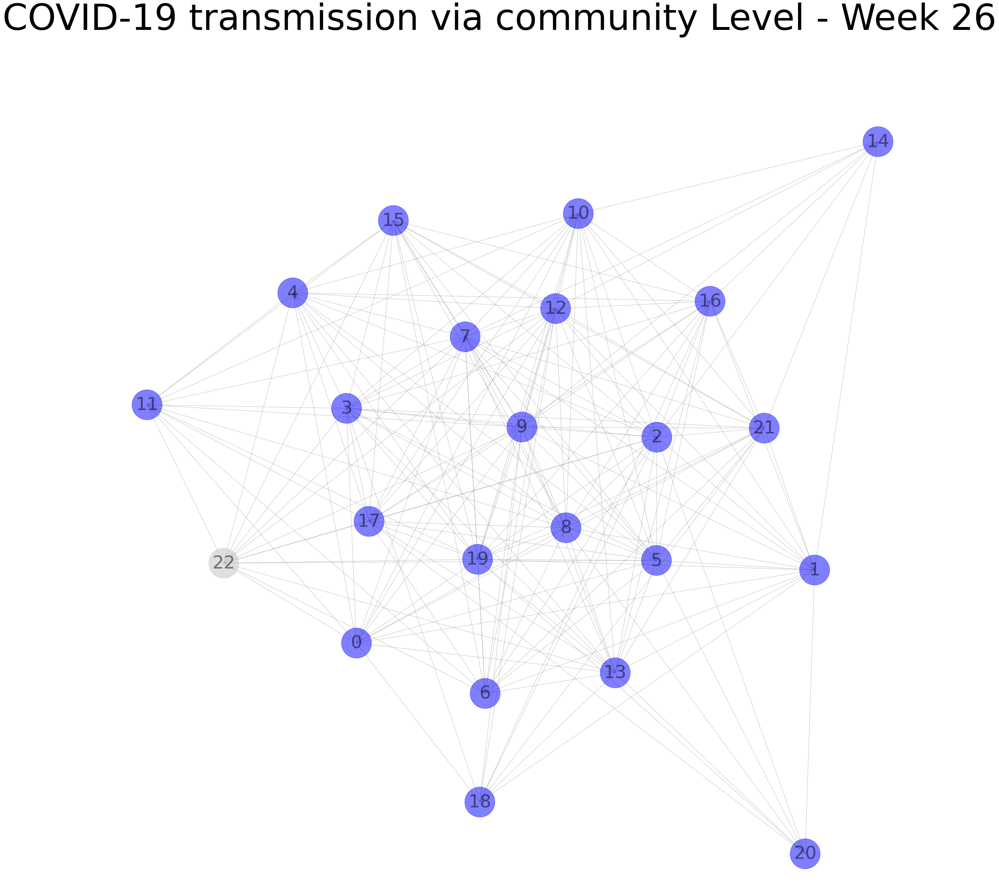

In [30]:
#visualize community network graph - weekly data 
print("Total number of communities=", len(G_comm.nodes()))
plt.figure(figsize=(40,40))

pos=nx.spring_layout(G_comm)

color_map = status(list_of_statuses)
week=step(list_of_statuses)

def draw_next_status(n):
    plt.cla()
    c_map = next(color_map, colors.values())
    nx.draw(G_comm, pos, node_color=c_map, node_size=7000, edge_width=100, edge_color= '0.5', with_labels=True,font_size=50, alpha=0.5)
    plt.suptitle("COVID-19 transmission via community Level - Week "+str(next(week)),size=100)
        
ani = animation.FuncAnimation(plt.gcf(), draw_next_status, interval=1000, frames=iter(list_of_statuses), repeat=False)


ani.save('output/covid_community_week.gif', writer='Pillow')